# Chapter 3: Sampling, Convolution and Discrete Fourier Transform

## Problems

## 0. Fourier Transform Basics

In [1]:
from IPython.core.display import display,HTML
display(HTML('<style>.prompt{width: 0px; min-width: 0px; visibility: collapse}</style>'))

In [2]:
# comment the next line only if you are not running this code from jupyter notebook
%matplotlib inline
import numpy as np
import numpy.fft as fp
from scipy import signal
import scipy.fftpack
from skimage.io import imread
from skimage.color import rgb2gray 
from skimage.metrics import peak_signal_noise_ratio
from scipy.ndimage import convolve
import cv2
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D  # noqa: F401 unused import
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.ticker import LinearLocator, FormatStrFormatter

In [46]:
def plot_image(im, title):
    plt.imshow(im, cmap='gray')
    plt.axis('off')
    plt.title(title, size=20)

In [47]:
def plot_freq_spectrum(F, title, cmap=plt.cm.gray, show_axis=True, colorbar=False):
    plt.imshow((20*np.log10(0.1 + fp.fftshift(F))).real.astype(int), cmap=cmap)
    if not show_axis:
        plt.axis('off')
    if colorbar:
        plt.colorbar()
    plt.title(title, size=20)

In [11]:
h, w = 100, 100
images = list()
im = np.zeros((h,w))
for x in range(h):
    im[x,:] = np.sin(x)
images.append(im)
im = np.zeros((h,w))
for y in range(w):
    im[:,y] = np.sin(y)
images.append(im)

In [12]:
im = np.zeros((h,w))
for x in range(h):
    for y in range(w):
        im[x,y] = np.sin(x + y) 
images.append(im)
im = np.zeros((h,w))
for x in range(h):
    for y in range(w):
        if (x-h/2)**2 + (y-w/2)**2 < 100:
            im[x,y] = np.sin(x + y) 
images.append(im)

In [13]:
im = np.zeros((h,w))
for x in range(h):
    for y in range(w):
        if (x-h/2)**2 + (y-w/2)**2 < 25:
            im[x,y] = 1 
images.append(im)
im = np.zeros((h,w))
im[h//2 -5:h//2 + 5, w//2 -5:w//2 + 5] = 1 
images.append(im)

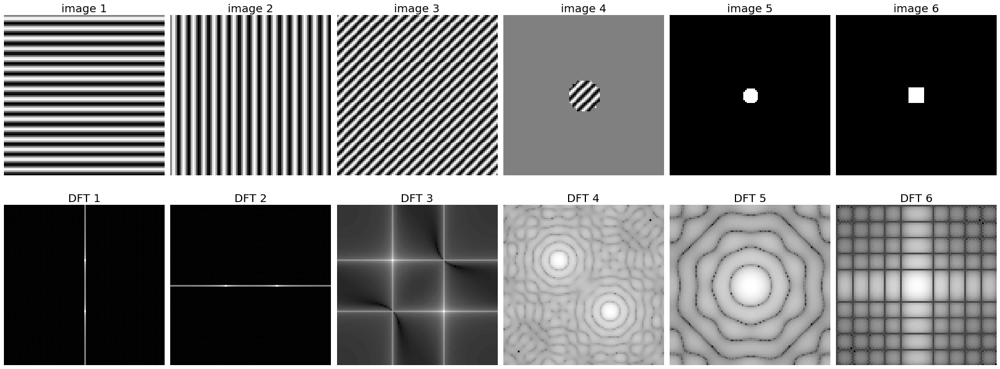

In [14]:
plt.figure(figsize=(25,10))
i = 1
for im in images:
    plt.subplot(2,6,i), plot_image(im, 'image {}'.format(i))
    plt.subplot(2,6,i+6), plot_freq_spectrum(fp.fft2(im), 'DFT {}'.format(i), show_axis=False)
    i += 1
plt.tight_layout()
plt.show() 

In [15]:
im = rgb2gray(imread("images/Img_03_01.jpg"))
h, w = im.shape
F = fp.fft2(im)
F_shifted = fp.fftshift(F)

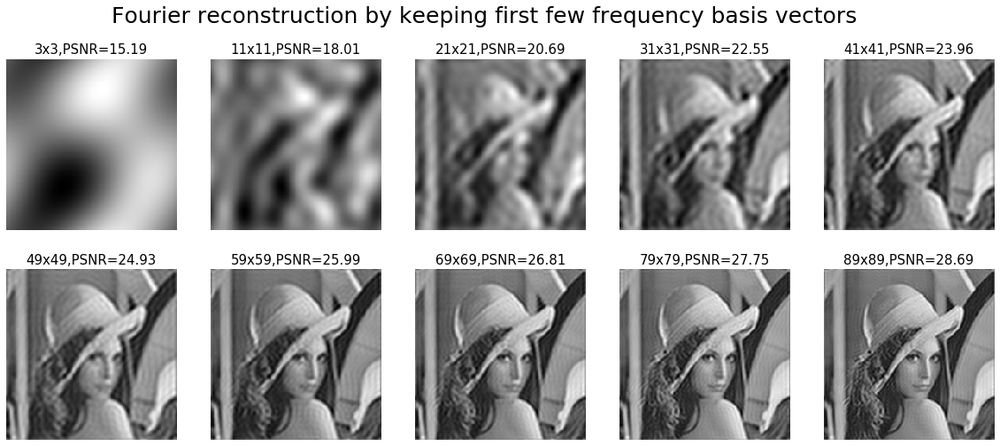

In [31]:
xs = list(map(int, np.linspace(1, h//5, 10)))
ys = list(map(int, np.linspace(1, w//5, 10)))
plt.figure(figsize=(20,8))
plt.gray()
for i in range(10):
    F_mask = np.zeros((h, w))
    F_mask[h//2-xs[i]:h//2+xs[i]+1, w//2-ys[i]:w//2+ys[i]+1] = 1 
    F1 = F_shifted*F_mask
    im_out =  fp.ifft2(fp.ifftshift(F1)).real #np.abs()
    plt.subplot(2,5,i+1), plt.imshow(im_out), plt.axis('off')
    plt.title('{}x{},PSNR={}'.format(2*xs[i]+1, 2*ys[i]+1, round(peak_signal_noise_ratio(im, im_out),2)), size=15)
plt.suptitle('Fourier reconstruction by keeping first few frequency basis vectors', size=25)
plt.show()

![](images/Img_03_25.png)

## 1. Sampling to increase/decrease the resolution of an image

### 1.1. Up-sampling an image by using DFT and a Low-pass-filter (LPF)

![](images/Img_03_38.png)

In [3]:
im = 255*rgb2gray(imread('images/Img_03_01.jpg'))
im1 = np.zeros((2*im.shape[0], 2*im.shape[1]))
print(im.shape, im1.shape)
for i in range(im.shape[0]):
    for j in range(im.shape[1]):
        im1[2*i,2*j] = im[i,j]

(220, 220) (440, 440)


In [4]:
kernel = [[0.25, 0.5, 0.25], [0.5, 1, 0.5], [0.25, 0.5, 0.25]]

![](images/Img_03_29.png)

In [5]:
def pad_with_zeros(vector, pad_width, iaxis, kwargs):
    vector[:pad_width[0]] = 0
    vector[-pad_width[1]:] = 0
    return vector

# Now enlarge the kernel to the shape of the image
kernel = np.pad(kernel, (((im1.shape[0]-3)//2,(im1.shape[0]-3)//2+1), ((im1.shape[1]-3)//2,(im1.shape[1]-3)//2+1)), pad_with_zeros) 

In [6]:
freq = fp.fft2(im1)
freq_kernel = fp.fft2(fp.ifftshift(kernel))

In [7]:
freq_LPF = freq*freq_kernel # by the Convolution theorem

In [8]:
im2 = fp.ifft2(freq_LPF).real

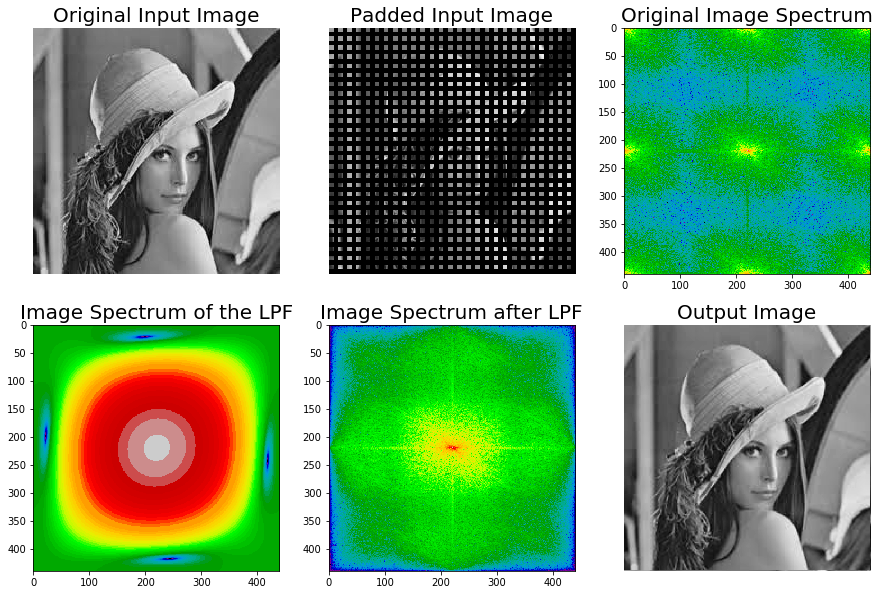

In [12]:
plt.figure(figsize=(15,10))
plt.gray() # show the filtered result in grayscale
cmap = 'nipy_spectral' #'viridis'
plt.subplot(231), plot_image(im, 'Original Input Image')
plt.subplot(232), plot_image(im1, 'Padded Input Image')
plt.subplot(233), plot_freq_spectrum(freq, 'Original Image Spectrum', cmap=cmap)
plt.subplot(234), plot_freq_spectrum(freq_kernel, 'Image Spectrum of the LPF', cmap=cmap)
plt.subplot(235), plot_freq_spectrum(fp.fft2(im2), 'Image Spectrum after LPF', cmap=cmap)
plt.subplot(236), plot_image(im2.astype(np.uint8), 'Output Image')
plt.show()

### 1.2. Down-sampling with Anti-Aliasing using Gaussian Filter

In [48]:
from skimage.filters import gaussian
from skimage import img_as_float
#im = rgb2gray(imread('images/Img_03_03.jpg'))
im = img_as_float(imread('images/Img_03_08.jpg'))
print(im.shape)

(480, 720, 3)


In [54]:
im_blurred = gaussian(im, sigma=1.25, multichannel=True) 

In [55]:
n = 4 # create and image 16 times smaller in size
h, w = im.shape[0] // n, im.shape[1] // n
im_small = np.zeros((h, w, 3))
for i in range(h):
   for j in range(w):
      im_small[i,j] = im[n*i, n*j]
im_small_aa = np.zeros((h, w, 3))
for i in range(h):
   for j in range(w):
      im_small_aa[i,j] = im_blurred[n*i, n*j]

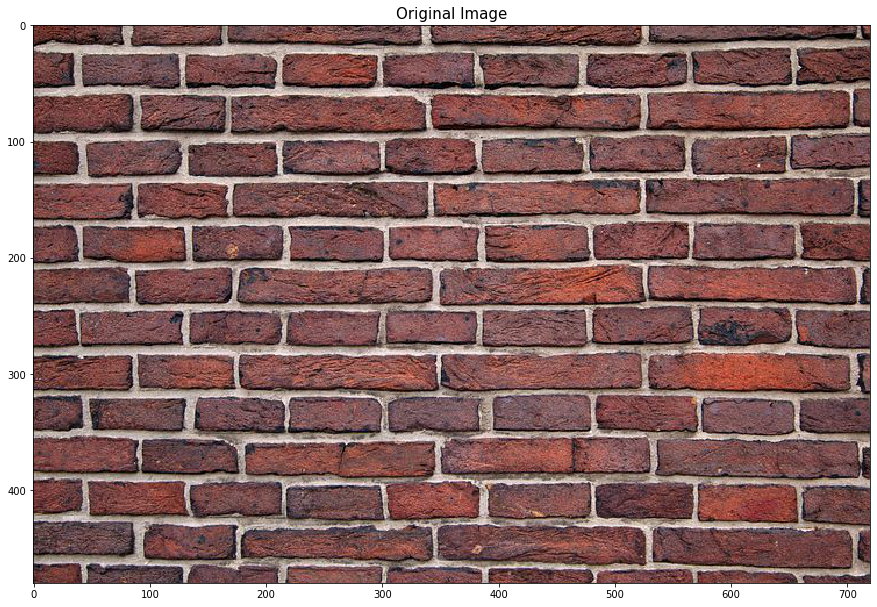

In [56]:
plt.figure(figsize=(15,15))
plt.imshow(im), plt.title('Original Image', size=15)
plt.show()

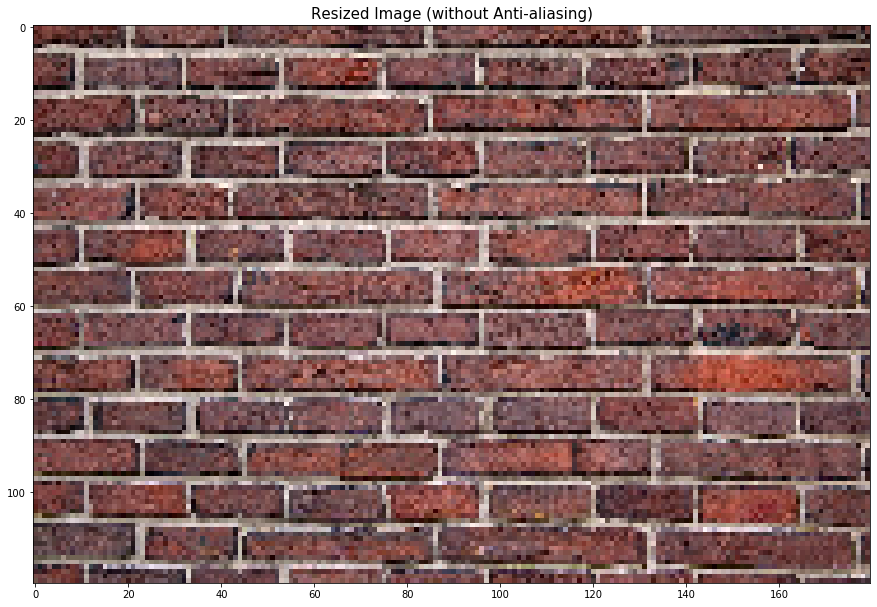

In [57]:
plt.figure(figsize=(15,15))
plt.imshow(im_small), plt.title('Resized Image (without Anti-aliasing)', size=15)
plt.show()

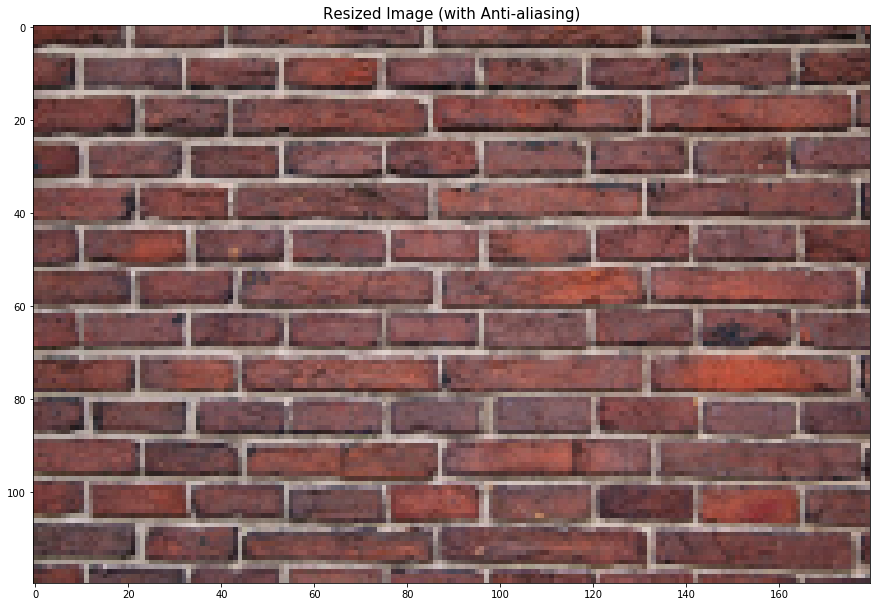

In [58]:
plt.figure(figsize=(15,15))
plt.imshow(im_small_aa), plt.title('Resized Image (with Anti-aliasing)', size=15)
plt.show()

## 2. Denoising an Image with LPF/Notch filter in the Frequency domain

### 2.1 Removing Periodic Noise with Notch Filter

In [206]:
im_noisy = rgb2gray(imread("images/Img_03_23.jpg"))
F_noisy = fp.fft2((im_noisy))
print(F_noisy.shape)

(380, 400)


In [207]:
def plot_freq_spectrum(F, title, cmap=plt.cm.gray):
    plt.imshow((20*np.log10(0.1 + fp.fftshift(F))).real.astype(int), cmap=cmap)
    plt.xticks(np.arange(0, im.shape[1], 25))
    plt.yticks(np.arange(0, im.shape[0], 25))
    plt.title(title, size=20)

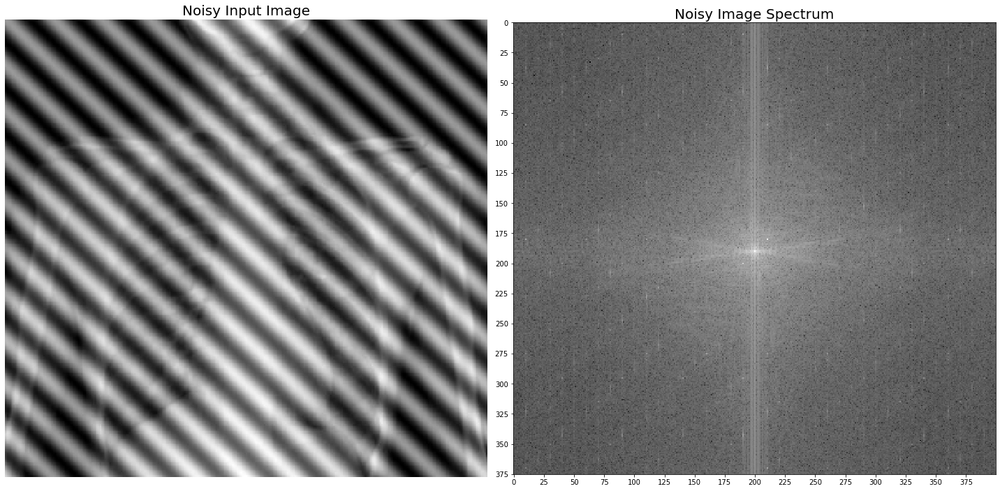

In [212]:
plt.figure(figsize=(20,10))

plt.subplot(121), plot_image(im_noisy, 'Noisy Input Image')
plt.subplot(122), plot_freq_spectrum(F_noisy, 'Noisy Image Spectrum') 

plt.tight_layout()
plt.show()

![](images/Img_03_23.png)

In [210]:
F_noisy_shifted = fp.fftshift(F_noisy)
F_noisy_shifted[180,210] = F_noisy_shifted[200,190] = 0
im_out =  fp.ifft2(fp.ifftshift(F_noisy_shifted)).real #np.abs()

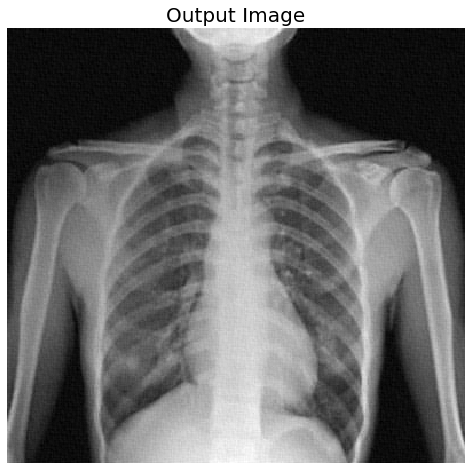

In [211]:
#print(signaltonoise(im1, axis=None))
plt.figure(figsize=(10,8))
plot_image(im_out, 'Output Image')
plt.show()

### 2.2 Removing salt-and-pepper noise using Gaussian LPF with scipy fftpack

In [13]:
from scipy import ndimage
from scipy import fftpack
from skimage.util import random_noise

In [14]:
im = rgb2gray(imread('images/Img_03_02.jpg'))
noisy = random_noise(im, mode='s&p')

In [17]:
im_freq = fftpack.fft2(im)
noisy_freq = fftpack.fft2(noisy)
sigma = 1 #0.1
noisy_smoothed_freq = ndimage.fourier_gaussian(noisy_freq, sigma=sigma)
noisy_smoothed = fftpack.ifft2(noisy_smoothed_freq)

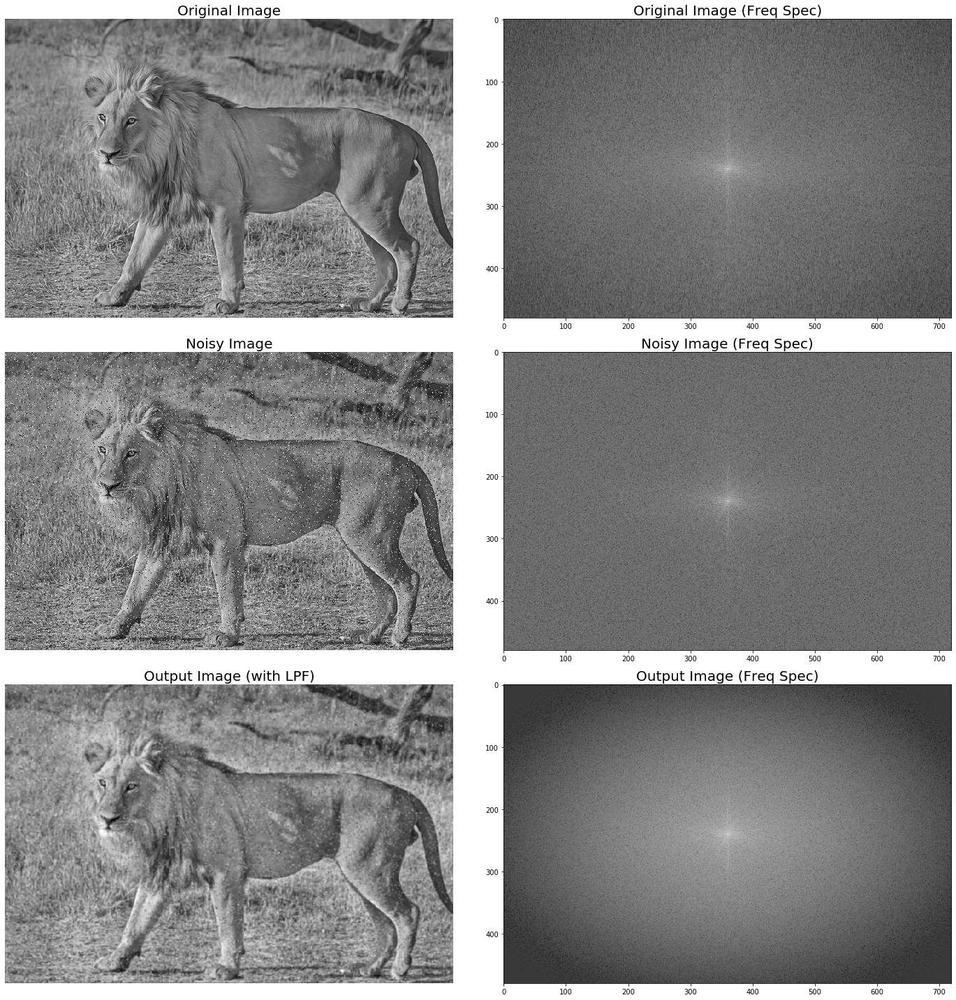

In [18]:
fig, ((ax1, ax2), (ax3, ax4), (ax5, ax6)) = plt.subplots(3, 2, figsize=(20,20))
plt.gray()  # show the filtered result in grayscale
ax1.imshow(im), ax1.axis('off'), ax1.set_title('Original Image', size=20)
ax2.imshow((20*np.log10(0.1 + fftpack.fftshift(im_freq))).real.astype(int))
ax2.set_title('Original Image (Freq Spec)', size=20)
ax3.imshow(noisy), ax3.axis('off'), ax3.set_title('Noisy Image', size=20)
ax4.imshow((20*np.log10( 0.1 + fftpack.fftshift(noisy_freq))).real.astype(int))
ax4.set_title('Noisy Image (Freq Spec)', size=20)
# the imaginary part is an artifact
ax5.imshow(noisy_smoothed.real), ax5.axis('off'), ax5.set_title('Output Image (with LPF)', size=20)
ax6.imshow( (20*np.log10( 0.1 + fftpack.fftshift(noisy_smoothed_freq))).real.astype(int))
ax6.set_title('Output Image (Freq Spec)', size=20)
plt.tight_layout()
plt.show()

## 3. Blurring an Image with an LPF in the Frequency domain

### 3.0 Different Blur Kernels and Convolution in the Frequency domain 

In [4]:
def get_gaussian_edge_blur_kernel(sigma, sz=15):
    # First create a 1-D Gaussian kernel
    x = np.linspace(-10, 10, sz)
    kernel_1d = np.exp(-x**2/sigma**2)
    kernel_1d /= np.trapz(kernel_1d) # normalize the sum to 1.0
    # create a 2-D Gaussian kernel from the 1-D kernel
    kernel_2d = kernel_1d[:, np.newaxis] * kernel_1d[np.newaxis, :]
    return kernel_2d

In [5]:
def get_motion_blur_kernel(ln, angle, sz=15):
    kern = np.ones((1, ln), np.float32)
    angle = -np.pi*angle/180
    c, s = np.cos(angle), np.sin(angle)
    A = np.float32([[c, -s, 0], [s, c, 0]])
    sz2 = sz // 2
    A[:,2] = (sz2, sz2) - np.dot(A[:,:2], ((ln-1)*0.5, 0))
    kern = cv2.warpAffine(kern, A, (sz, sz), flags=cv2.INTER_CUBIC)
    return kern

In [6]:
def get_out_of_focus_kernel(r, sz=15):
    kern = np.zeros((sz, sz), np.uint8)
    cv2.circle(kern, (sz, sz), r, 255, -1, cv2.LINE_AA, shift=1)
    kern = np.float32(kern) / 255
    return kern

In [39]:
def dft_convolve(im, kernel):
    F_im = fp.fft2(im)
    #F_kernel = fp.fft2(kernel, s=im.shape)
    F_kernel = fp.fft2(fp.ifftshift(kernel), s=im.shape)
    F_filtered = F_im * F_kernel
    im_filtered = fp.ifft2(F_filtered)
    cmap = 'RdBu'
    plt.figure(figsize=(20,10))
    plt.gray()
    plt.subplot(131), plt.imshow(im), plt.axis('off'), plt.title('input image', size=20)
    plt.subplot(132), plt.imshow(kernel, cmap=cmap), plt.title('kernel', size=20)
    plt.subplot(133), plt.imshow(im_filtered.real), plt.axis('off'), plt.title('output image', size=20)
    plt.tight_layout()
    plt.show()

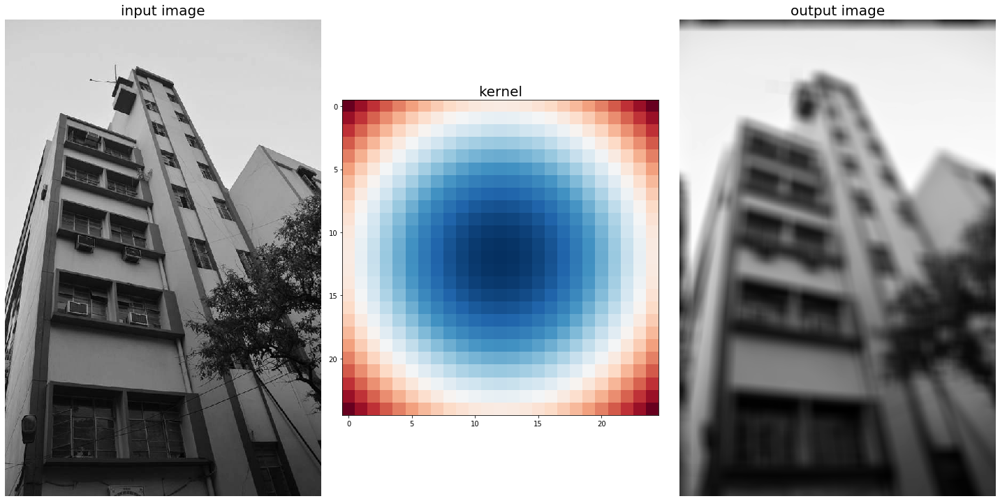

In [40]:
im = rgb2gray(imread('images/Img_03_03.jpg'))

kernel = get_gaussian_edge_blur_kernel(25, 25)
dft_convolve(im, kernel)

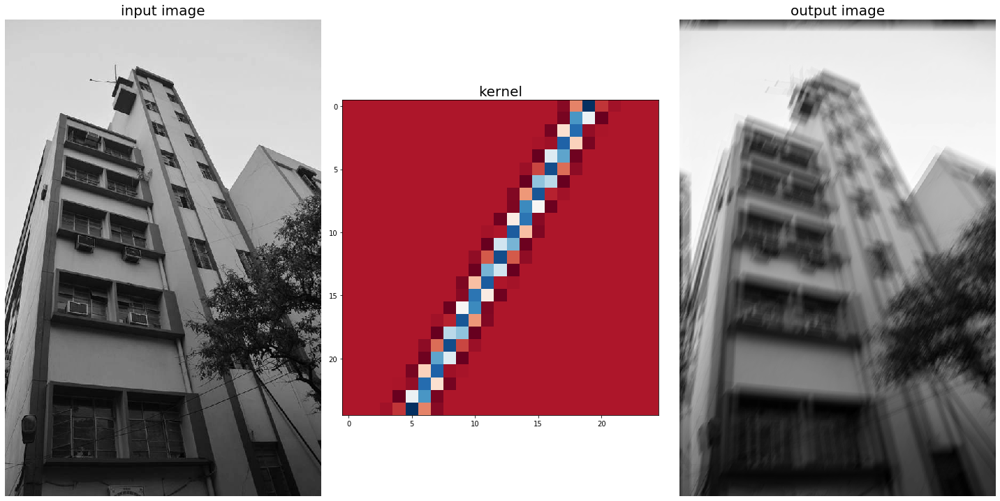

In [41]:
kernel = get_motion_blur_kernel(30, 60, 25)
dft_convolve(im, kernel)

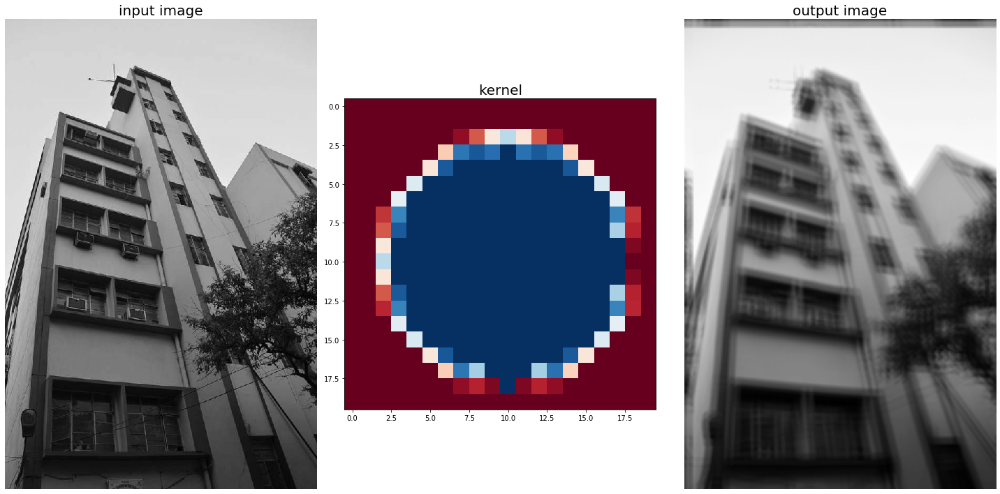

In [42]:
kernel = get_out_of_focus_kernel(15, 20)
dft_convolve(im, kernel)

### 3.1 Blurring with scipy.ndimage frequency-domain filters

In [79]:
im = imread('images/Img_03_31.png')
freq = fp.fft2(im)

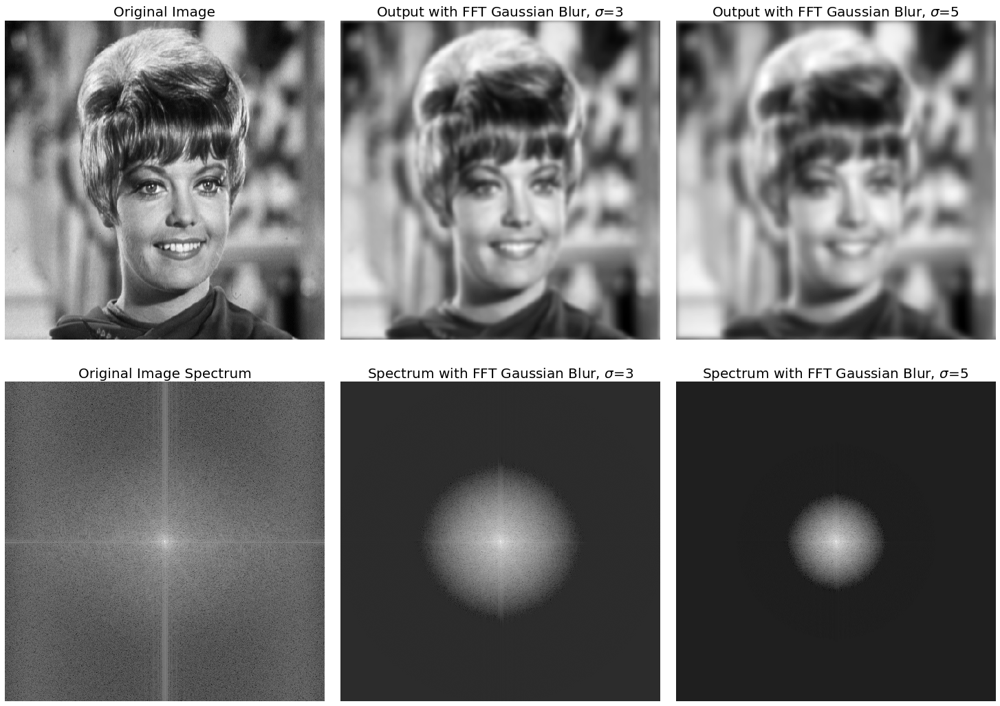

In [39]:
fig, axes = plt.subplots(2, 3, figsize=(20,15))
plt.subplots_adjust(0,0,1,0.95,0.05,0.05)
plt.gray() # show the filtered result in grayscale
axes[0, 0].imshow(im), axes[0, 0].set_title('Original Image', size=20)
axes[1, 0].imshow((20*np.log10( 0.1 + fp.fftshift(freq))).real.astype(int)), axes[1, 0].set_title('Original Image Spectrum', size=20)
i = 1
for sigma in [3,5]:
    convolved_freq = ndimage.fourier_gaussian(freq, sigma=sigma)
    convolved = fp.ifft2(convolved_freq).real # the imaginary part is an artifact
    axes[0, i].imshow(convolved) 
    axes[0, i].set_title(r'Output with FFT Gaussian Blur, $\sigma$={}'.format(sigma), size=20)
    axes[1, i].imshow((20*np.log10( 0.1 + fp.fftshift(convolved_freq))).real.astype(int))
    axes[1, i].set_title(r'Spectrum with FFT Gaussian Blur, $\sigma$={}'.format(sigma), size=20)
    i += 1
for a in axes.ravel():
    a.axis('off')    
plt.show()

#### With fourier_uniform

In [22]:
im = imread('images/Img_03_31.png')
freq = fp.fft2(im)
freq_uniform = ndimage.fourier_uniform(freq, size=10)

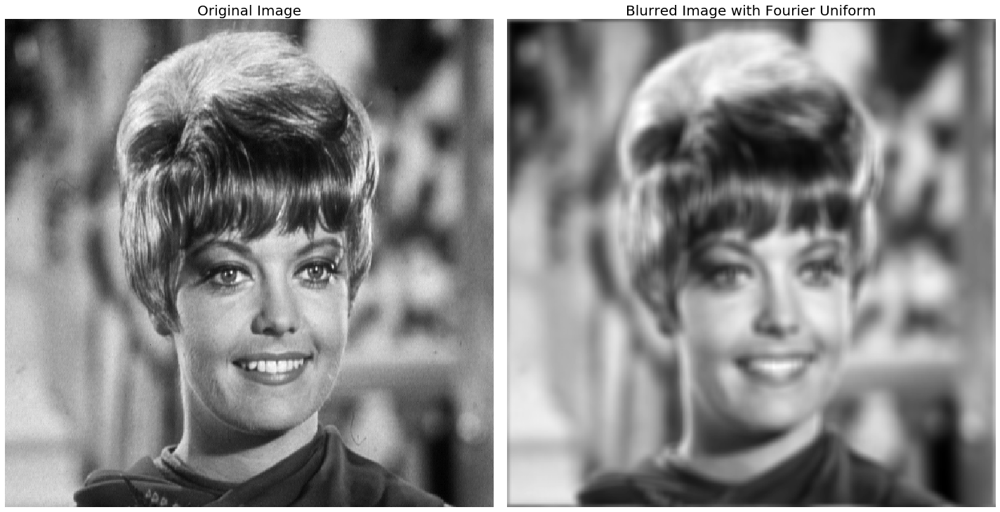

In [30]:
fig, (axes1, axes2) = plt.subplots(1, 2, figsize=(20,10))
plt.gray() # show the result in grayscale
im1 = fp.ifft2(freq_uniform)
axes1.imshow(im), axes1.axis('off')
axes1.set_title('Original Image', size=20)
axes2.imshow(im1.real) # the imaginary part is an artifact
axes2.axis('off')
axes2.set_title('Blurred Image with Fourier Uniform', size=20)
plt.tight_layout()
plt.show()

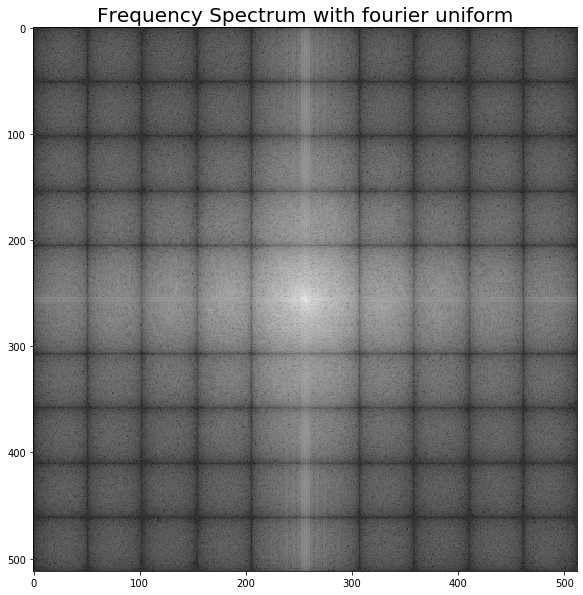

In [29]:
plt.figure(figsize=(10,10))
plt.imshow( (20*np.log10( 0.1 + fp.fftshift(freq_uniform))).real.astype(int))
plt.title('Frequency Spectrum with fourier uniform', size=20)
plt.show()

#### With fourier_ellipsoid

In [25]:
freq_ellipsoid = ndimage.fourier_ellipsoid(freq, size=10)
im1 = fp.ifft2(freq_ellipsoid)

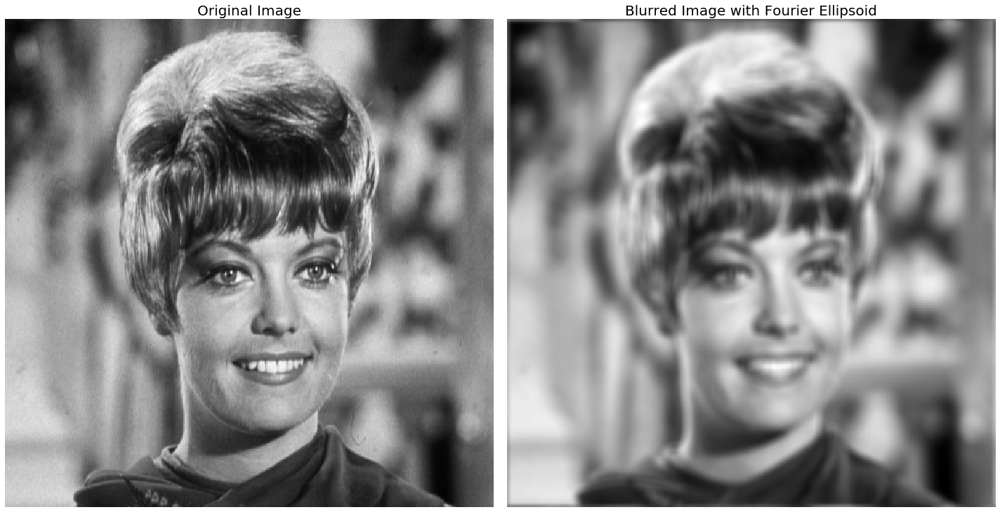

In [31]:
fig, (axes1, axes2) = plt.subplots(1, 2, figsize=(20,10))
axes1.imshow(im), axes1.axis('off')
axes1.set_title('Original Image', size=20)
axes2.imshow(im1.real) # the imaginary part is an artifact
axes2.axis('off')
axes2.set_title('Blurred Image with Fourier Ellipsoid', size=20)
plt.tight_layout()
plt.show()

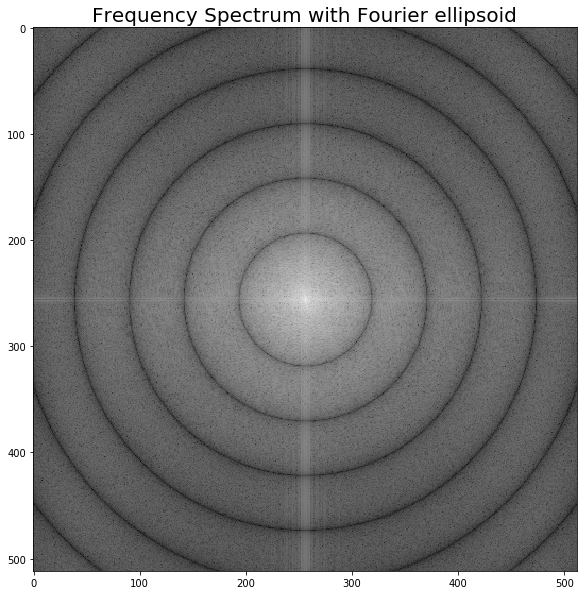

In [28]:
plt.figure(figsize=(10,10))
plt.imshow( (20*np.log10( 0.1 + fp.fftshift(freq_ellipsoid))).real.astype(int))
plt.title('Frequency Spectrum with Fourier ellipsoid', size=20)
plt.show()

### 3.2 Gaussian Blur LowPass Filter with scipy.fftpack

In [82]:
#im = rgb2gray(imread('images/Img_03_04.jpg'))
im = rgb2gray(imread('images/Img_03_11.jpg'))
freq = fp.fft2(im)

In [83]:
kernel = np.outer(signal.gaussian(im.shape[0], 1), signal.gaussian(im.shape[1], 1))
#assert(freq.shape == kernel.shape)

In [84]:
freq_kernel = fp.fft2(fp.ifftshift(kernel))

In [85]:
convolved = freq*freq_kernel # by the Convolution theorem

In [86]:
im_blur = fp.ifft2(convolved).real
im_blur = 255 * im_blur / np.max(im_blur)

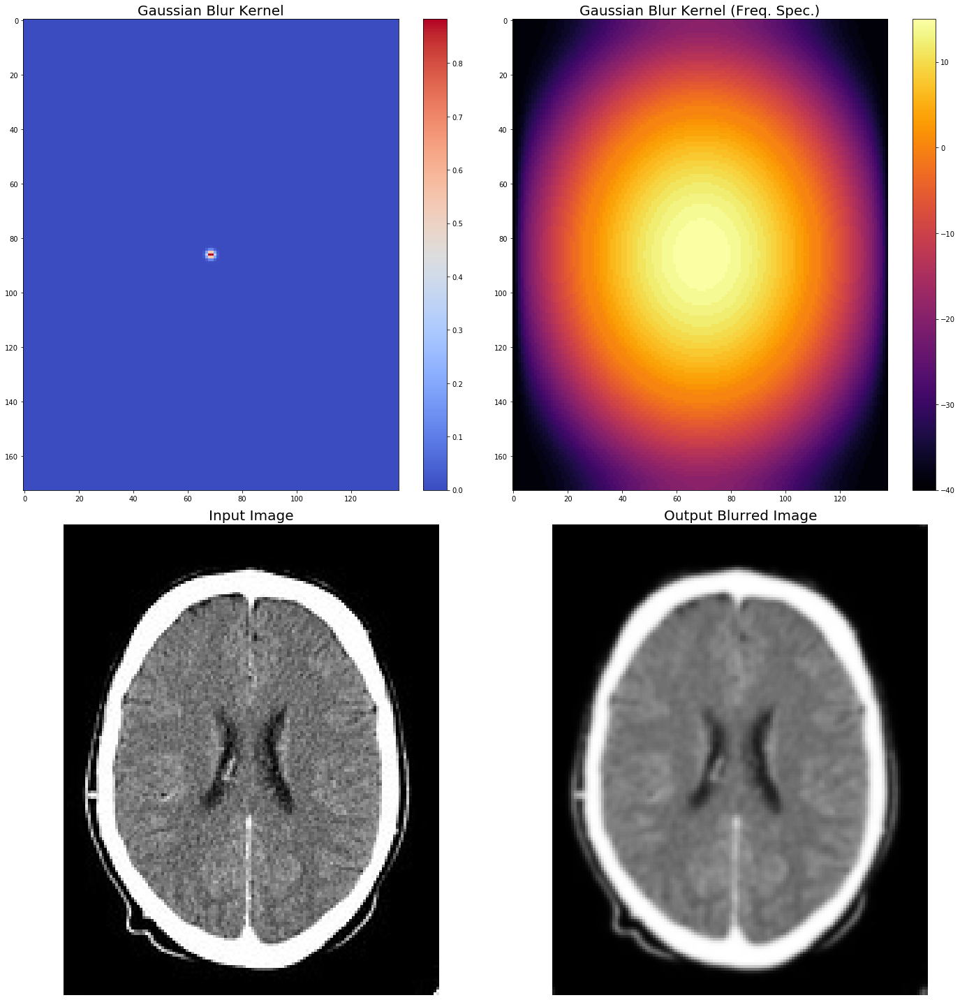

In [87]:
plt.figure(figsize=(20,20))
plt.subplot(221), plt.imshow(kernel, cmap='coolwarm'), plt.colorbar()
plt.title('Gaussian Blur Kernel', size=20)
# center the frequency response
plt.subplot(222)
plt.imshow( (20*np.log10( 0.01 + fp.fftshift(freq_kernel))).real.astype(int), cmap='inferno')
plt.colorbar()
plt.title('Gaussian Blur Kernel (Freq. Spec.)', size=20)
plt.subplot(223), plt.imshow(im, cmap='gray'), plt.axis('off'), plt.title('Input Image', size=20)
plt.subplot(224), plt.imshow(im_blur, cmap='gray'), plt.axis('off'), plt.title('Output Blurred Image', size=20)
plt.tight_layout()
plt.show()

In [72]:
def plot_3d(X, Y, Z, cmap=plt.cm.seismic):
    fig = plt.figure(figsize=(20,20))
    ax = fig.gca(projection='3d')
    # Plot the surface.
    surf = ax.plot_surface(X, Y, Z, cmap=cmap, linewidth=5, antialiased=False)
    #ax.plot_wireframe(X, Y, Z, rstride=10, cstride=10)
    #ax.set_zscale("log", nonposx='clip')
    #ax.zaxis.set_scale('log')
    ax.zaxis.set_major_locator(LinearLocator(10))
    ax.zaxis.set_major_formatter(FormatStrFormatter('%.02f'))
    ax.set_xlabel('F1', size=30)
    ax.set_ylabel('F2', size=30)
    ax.set_zlabel('Freq Response', size=30)
    #ax.set_zlim((-40,10))
    # Add a color bar which maps values to colors.
    fig.colorbar(surf) #, shrink=0.15, aspect=10)
    #plt.title('Frequency Response of the Gaussian Kernel')
    plt.show()    

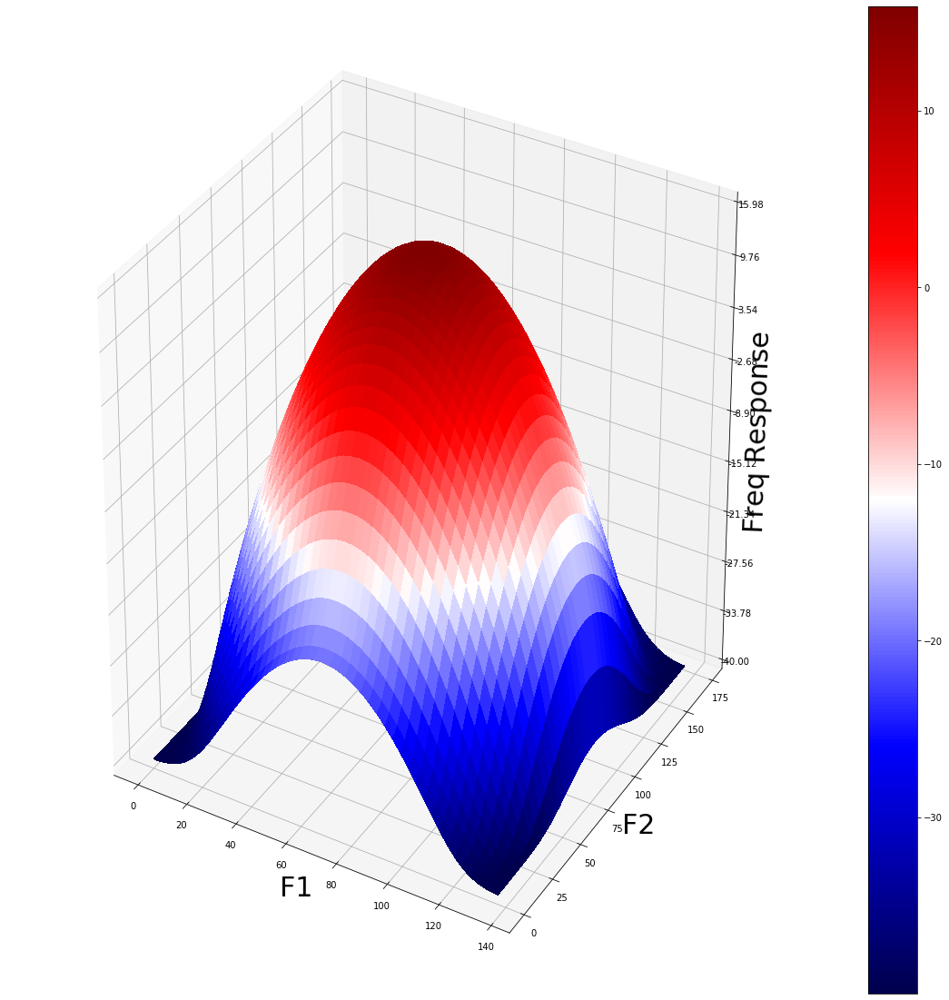

In [73]:
Y = np.arange(freq.shape[0]) #-freq.shape[0]//2,freq.shape[0]-freq.shape[0]//2)
X = np.arange(freq.shape[1]) #-freq.shape[1]//2,freq.shape[1]-freq.shape[1]//2)
X, Y = np.meshgrid(X, Y)
Z = (20*np.log10( 0.01 + fp.fftshift(freq_kernel))).real
plot_3d(X,Y,Z)

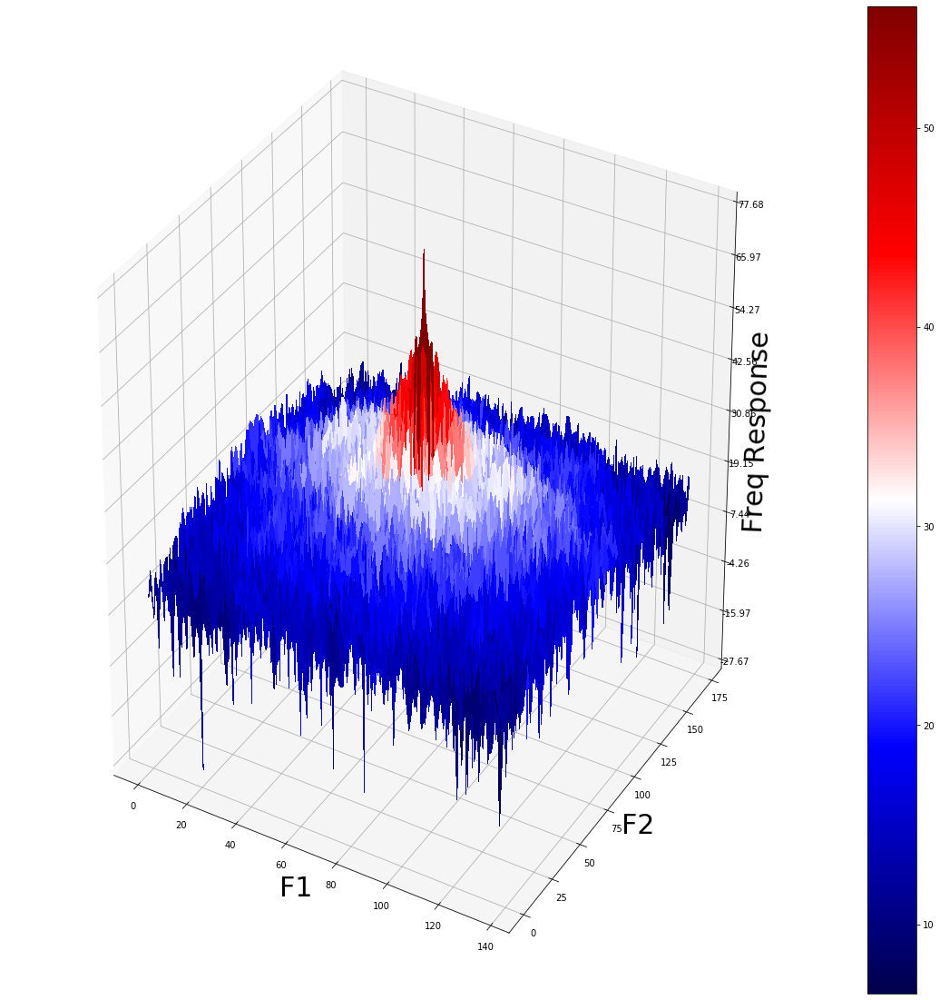

In [74]:
Z = (20*np.log10( 0.01 + fp.fftshift(freq))).real
plot_3d(X,Y,Z)

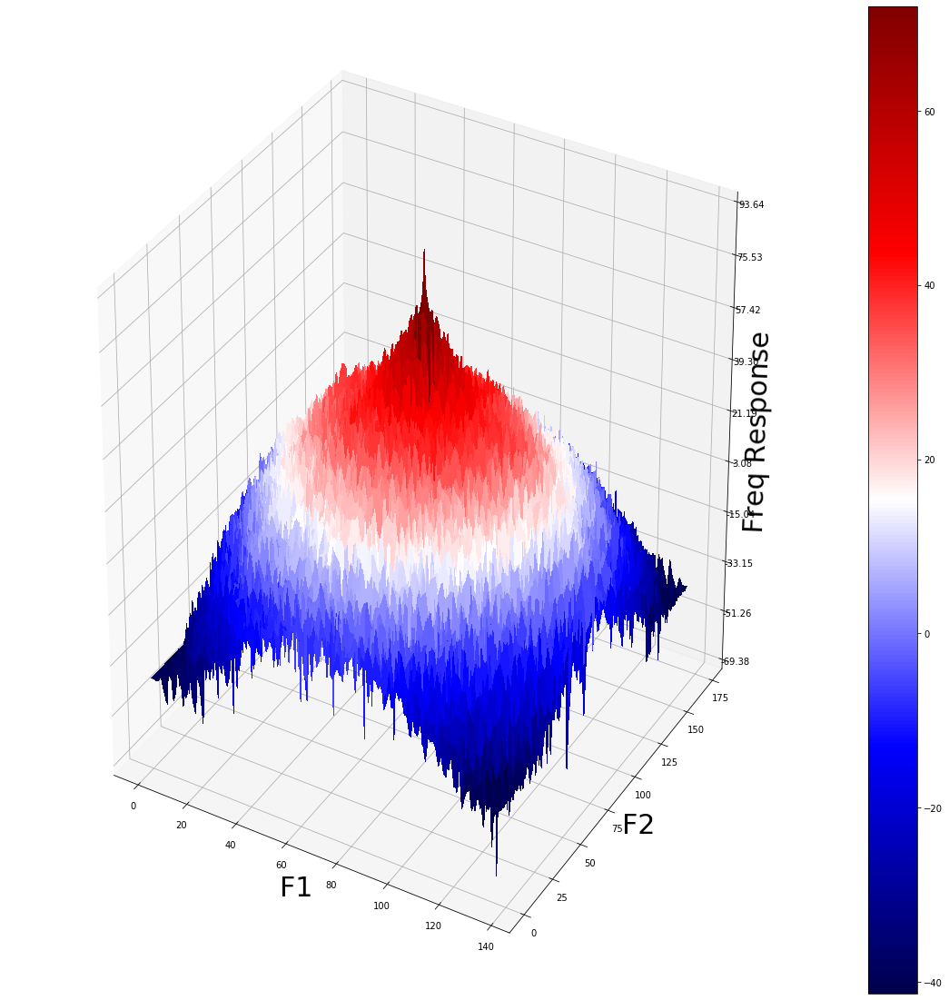

In [75]:
Z = (20*np.log10( 0.01 + fp.fftshift(convolved))).real
plot_3d(X,Y,Z)

### 3.3 Convolution in frequency domain with a colored image using fftconvolve from scipy signal

In [89]:
from skimage import img_as_float
from scipy import signal
im = img_as_float(plt.imread('images/Img_03_07.jpg'))

In [90]:
kernel = get_gaussian_edge_blur_kernel(sigma=10, sz=15)
im1 = signal.fftconvolve(im, kernel[:, :, np.newaxis], mode='same')
im1 = im1 / np.max(im1)

In [95]:
kernel = np.array([[0,-1,0],[-1,4,-1],[0,-1,0]])
im2 = signal.fftconvolve(im, kernel[:, :, np.newaxis], mode='same')
im2 = im2 / np.max(im2)
im2 = np.clip(im2, 0, 1)

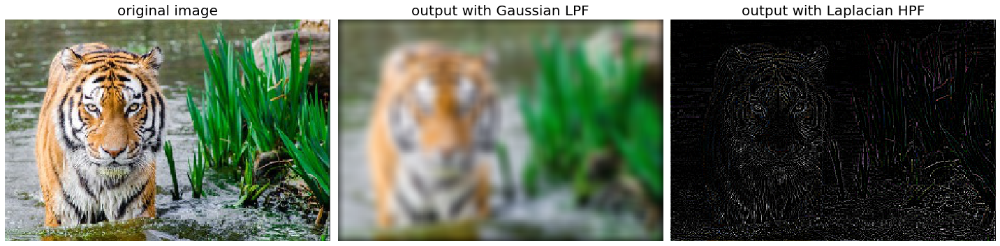

In [94]:
plt.figure(figsize=(20,10))
plt.subplot(131), plt.imshow(im), plt.axis('off'), plt.title('original image', size=20)
plt.subplot(132), plt.imshow(im1), plt.axis('off'), plt.title('output with Gaussian LPF', size=20)
plt.subplot(133), plt.imshow(im2), plt.axis('off'), plt.title('output with Laplacian HPF', size=20)
plt.tight_layout()
plt.show()

## 4. Edge Detection with High-Pass Filters (HPF) in the Frequency domain

In [32]:
def dft2(im):
    
    freq = cv2.dft(np.float32(im), flags = cv2.DFT_COMPLEX_OUTPUT)
    freq_shift = np.fft.fftshift(freq)
    mag, phase = freq_shift[:,:,0], freq_shift[:,:,1]

    return mag + 1j*phase

In [33]:
def idft2(freq):
    
    real, imag = freq.real, freq.imag
    back = cv2.merge([real, imag]) 
    back_ishift = np.fft.ifftshift(back)
    im = cv2.idft(back_ishift, flags=cv2.DFT_SCALE)
    im = cv2.magnitude(im[:,:,0], im[:,:,1])

    return im

In [34]:
def ideal(sz, D0):
    h, w = sz
    u, v = np.meshgrid(range(-w//2,w//2), range(-h//2,h//2)) #, sparse=True)
    return np.sqrt(u**2 + v**2) > D0
    
def gaussian(sz, D0):
    h, w = sz
    u, v = np.meshgrid(range(-w//2,w//2), range(-h//2,h//2)) #, sparse=True)
    return 1-np.exp(-(u**2 + v**2)/(2*D0**2)) 

def butterworth(sz, D0, n=1):
    h, w = sz
    u, v = np.meshgrid(range(-w//2,w//2), range(-h//2,h//2)) #, sparse=True)
    return 1 / (1 + (D0/(0.01+np.sqrt(u**2 + v**2)))**(2*n))

In [62]:
def plot_HPF(im, f, D0s):
    freq = dft2(im) 
    fig = plt.figure(figsize=(20,20))
    plt.subplots_adjust(0,0,1,0.95,0.05,0.05)
    i = 1
    for D0 in D0s:
        freq_kernel = f(im.shape, D0) 
        convolved = freq*freq_kernel # by the Convolution theorem
        im_convolved = idft2(convolved).real 
        im_convolved = (255 * im_convolved / np.max(im_convolved)).astype(np.uint8)
        plt.subplot(2,2,i)
        last_axes = plt.gca()
        img = plt.imshow((20*np.log10(0.01 + freq_kernel)).astype(int), cmap='coolwarm')
        divider = make_axes_locatable(img.axes)
        cax = divider.append_axes("right", size="5%", pad=0.05)
        fig.colorbar(img, cax=cax)
        plt.sca(last_axes), plt.title('{} HPF Kernel (freq)'.format(f.__name__), size=20)
        plt.subplot(2,2,i+2), plt.imshow(im_convolved), plt.axis('off')
        plt.title(r'output with {} HPF ($D_0$={})'.format(f.__name__, D0), size=20)
        i += 1
    plt.show()

In [63]:
def plot_HPF_3d(im, f, D0s):
    freq = dft2(im) 
    fig = plt.figure(figsize=(20,10))
    plt.subplots_adjust(0,0,1,0.95,0.05,0.05)
    i = 1
    for D0 in D0s:
        freq_kernel = f(im.shape, D0) 
        convolved = freq*freq_kernel # by the Convolution theorem
        Y = np.arange(freq_kernel.shape[0]) 
        X = np.arange(freq_kernel.shape[1]) 
        X, Y = np.meshgrid(X, Y)
        Z = (20*np.log10( 0.01 + convolved)).real
        ax = fig.add_subplot(1, 2, i, projection='3d')
        surf = ax.plot_surface(X, Y, Z, cmap=plt.cm.coolwarm, linewidth=0, antialiased=False)
        ax.zaxis.set_major_locator(LinearLocator(10)), ax.zaxis.set_major_formatter(FormatStrFormatter('%.02f'))
        ax.set_xlabel('F1', size=30), ax.set_ylabel('F2', size=30)
        plt.title(r'output with {} HPF (freq)'.format(f.__name__, D0), size=20)
        fig.colorbar(surf, shrink=0.5, aspect=10)
        i += 1
    plt.show()

In [64]:
def plot_filter_3d(sz, f, D0s, cmap=plt.cm.coolwarm):
    fig = plt.figure(figsize=(20,10))
    plt.subplots_adjust(0,0,1,0.95,0.05,0.05)
    i = 1
    for D0 in D0s:
        freq_kernel = f(sz, D0) 
        Y = np.arange(freq_kernel.shape[0])
        X = np.arange(freq_kernel.shape[1])
        X, Y = np.meshgrid(X, Y)
        Z = (20*np.log10( 0.01 + freq_kernel)).real
        ax = fig.add_subplot(1, 3, i, projection='3d')
        surf = ax.plot_surface(X, Y, Z, cmap=cmap, linewidth=0, antialiased=False)
        ax.zaxis.set_major_locator(LinearLocator(10))
        ax.zaxis.set_major_formatter(FormatStrFormatter('%.02f'))
        ax.set_xlabel('F1', size=30)
        ax.set_ylabel('F2', size=30)
        ax.set_title('{} HPF Kernel (freq)'.format(f.__name__), size=20)
        fig.colorbar(surf, shrink=0.5, aspect=10)
        i += 1

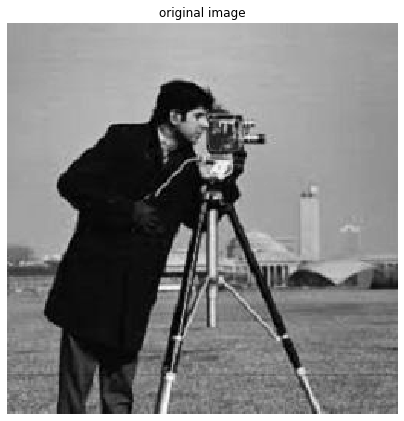

In [65]:
im = plt.imread('images/Img_03_12.png')
im = rgb2gray(im)
plt.figure(figsize=(7,12))
plt.imshow(im), plt.axis('off'), plt.title('original image')
plt.show()

In [66]:
D0 = [10, 30]

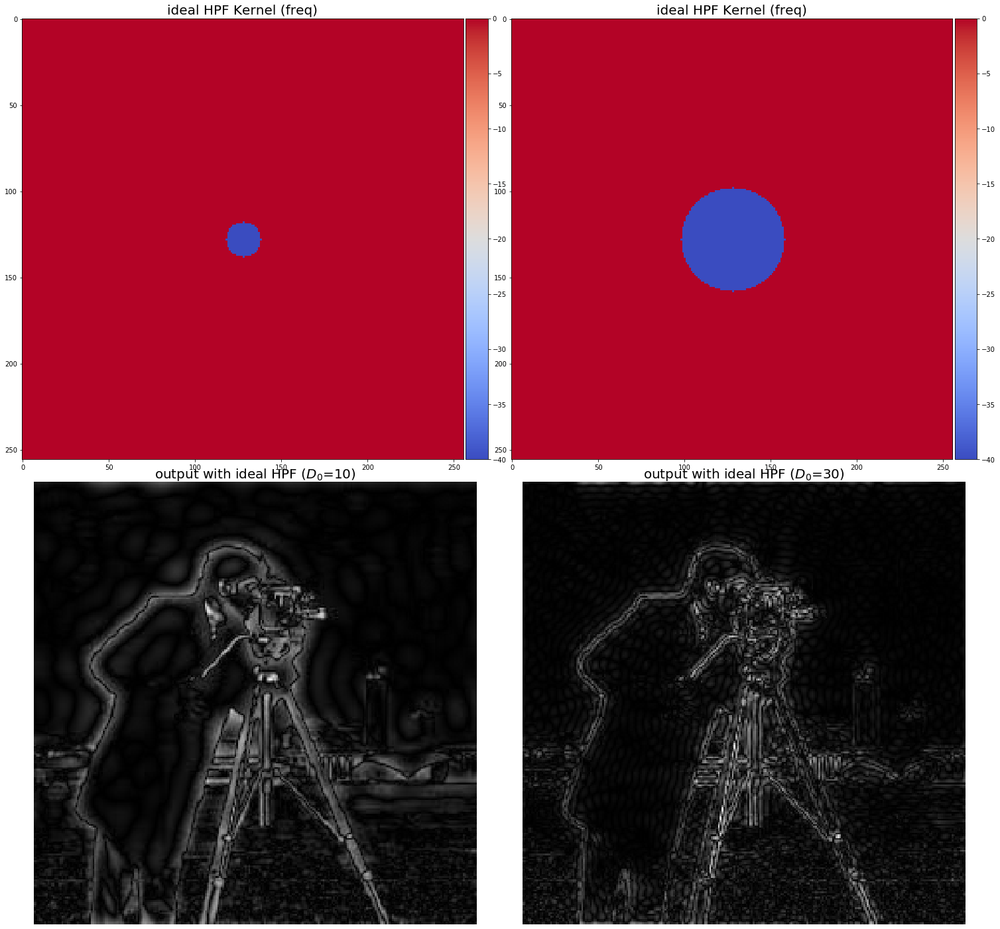

In [67]:
plot_HPF(im, ideal, D0)

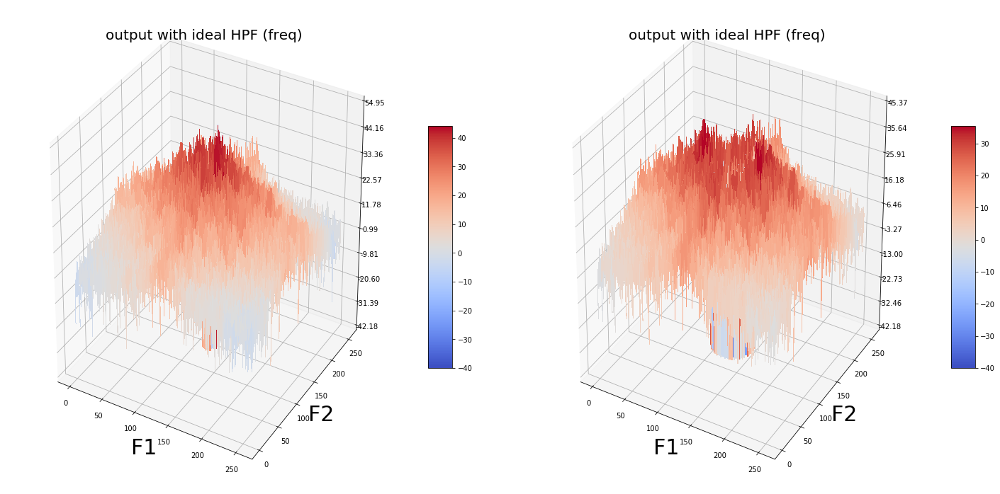

In [252]:
plot_HPF_3d(im, ideal, D0)

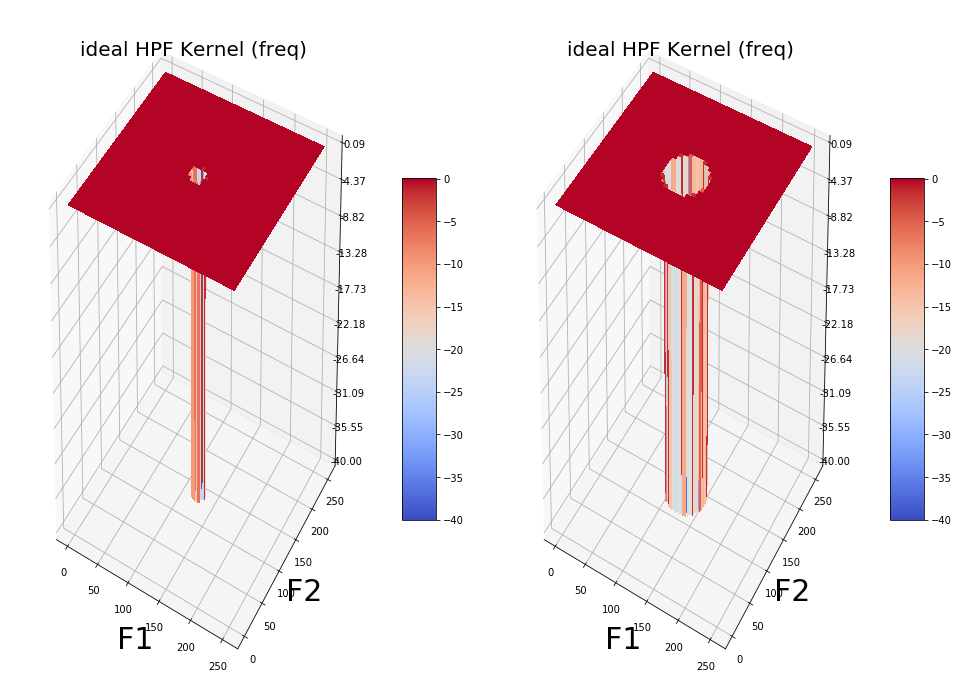

In [253]:
plot_filter_3d(im.shape, ideal, D0)

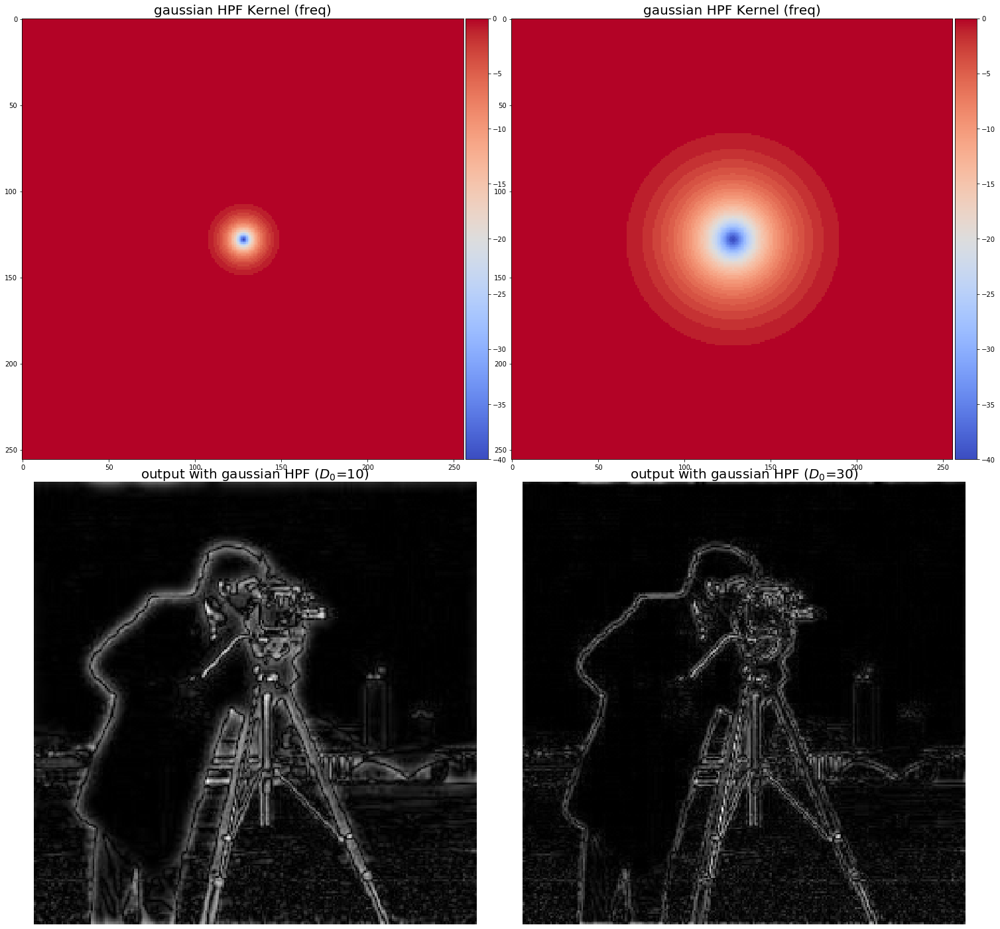

In [254]:
plot_HPF(im, gaussian, D0)

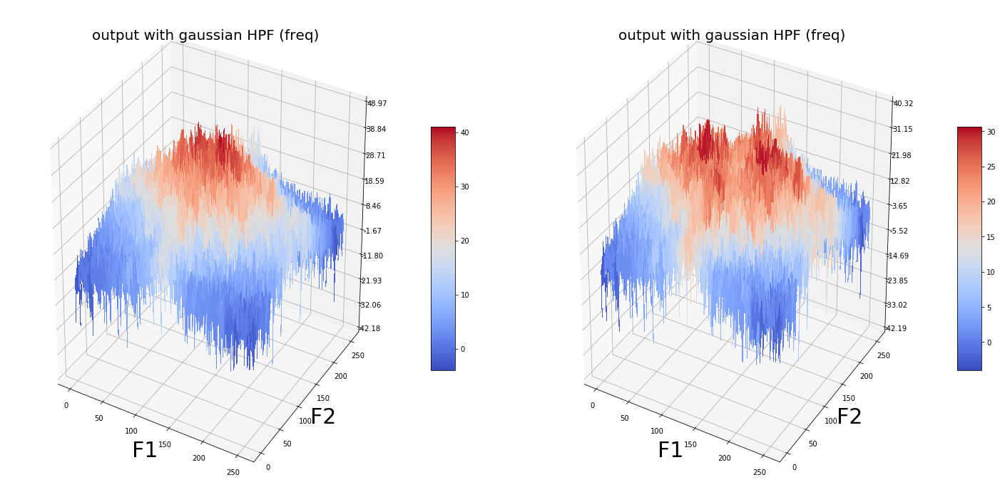

In [255]:
plot_HPF_3d(im, gaussian, D0)

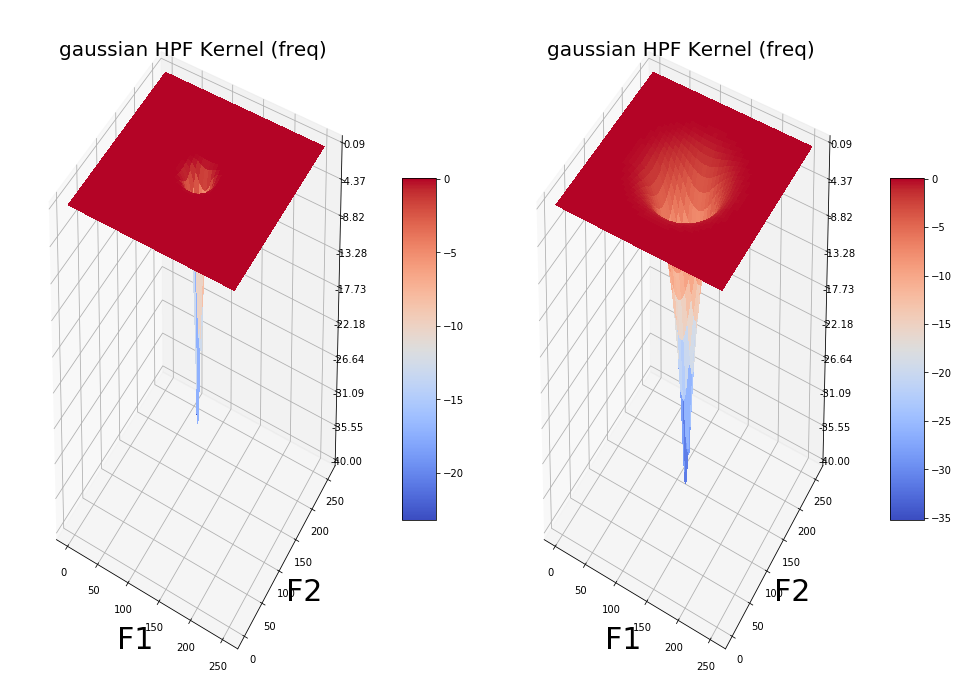

In [256]:
plot_filter_3d(im.shape, gaussian, D0)

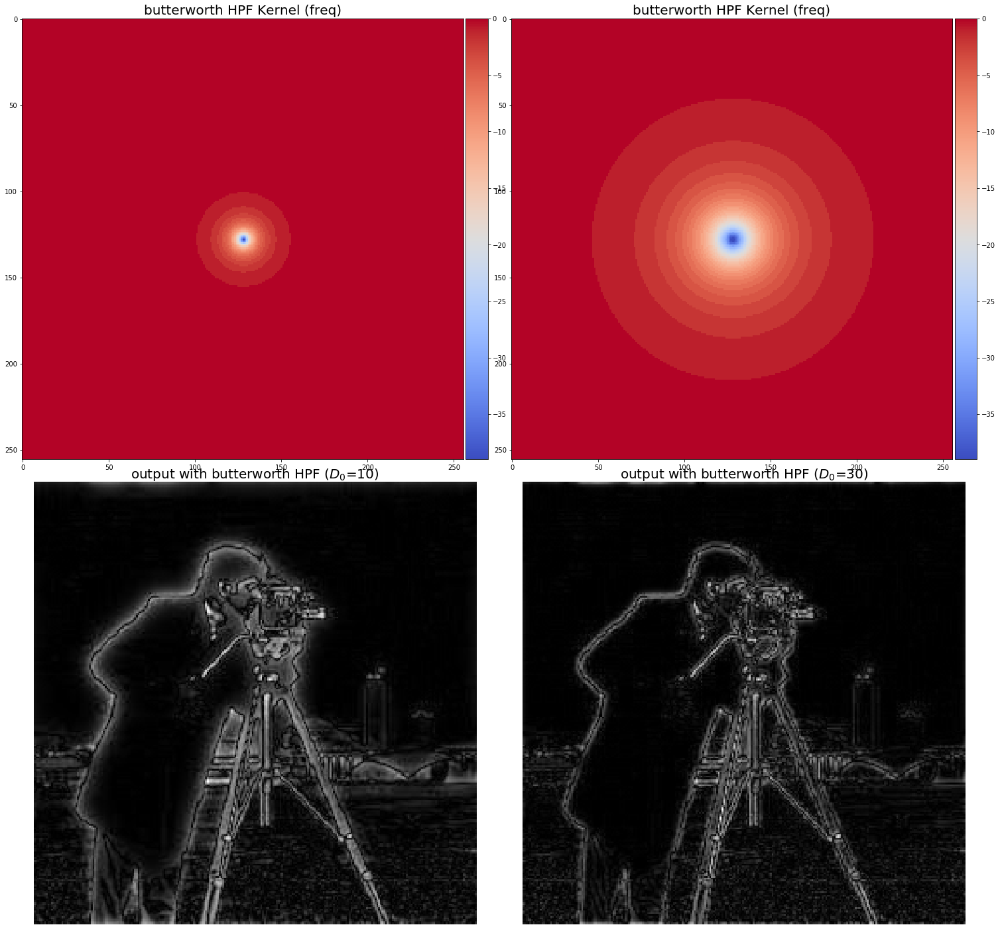

In [258]:
plot_HPF(im, butterworth, D0)

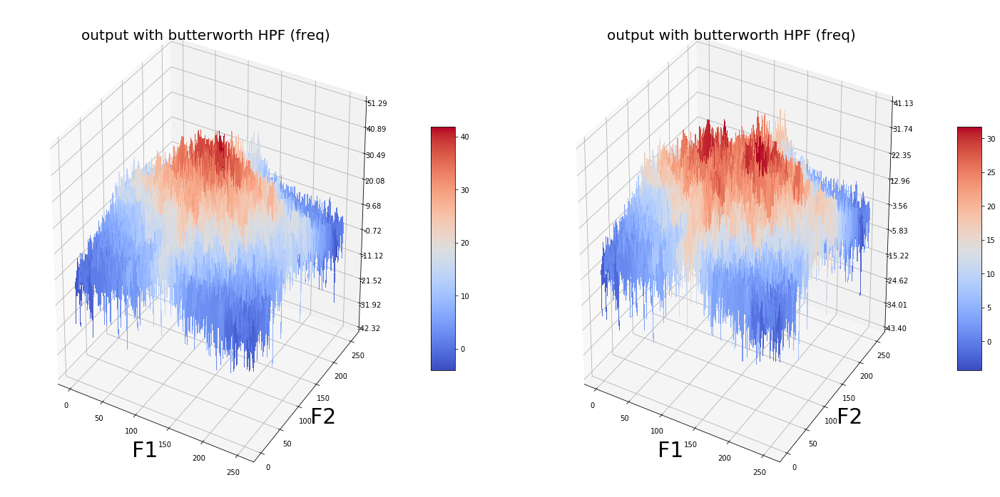

In [259]:
plot_HPF_3d(im, butterworth, D0)

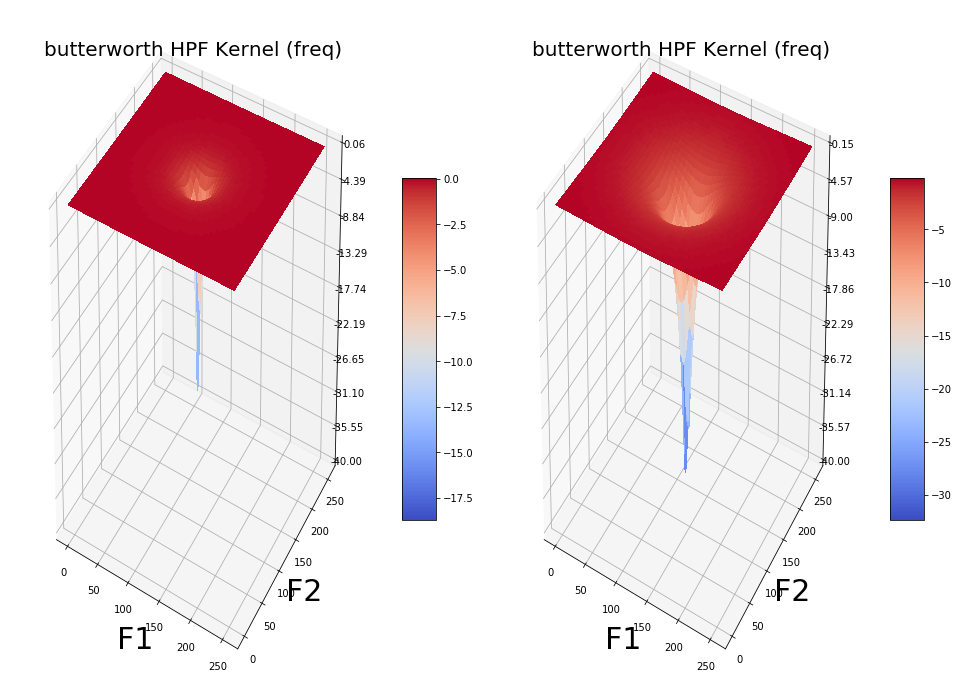

In [260]:
plot_filter_3d(im.shape, butterworth, D0)

## 5. Implement Homomorphic Filters

In [126]:
from skimage.filters import sobel, threshold_otsu

In [306]:
def homomorphic_filter(im, D0, g_l=0, g_h=1, n=1):
    im_log = np.log(im.astype(np.float)+1)
    im_fft = dft2(im_log)
    H = (g_h - g_l) * butterworth(im.shape, D0, n) + g_l
    #H = np.fft.ifftshift(H)
    im_fft_filt = H*im_fft
    #im_fft_filt = np.fft.ifftshift(im_fft_filt)
    im_filt = idft2(im_fft_filt)
    im = np.exp(im_filt.real)-1
    im = np.uint8(255*im/im.max())
    return im

In [307]:
image = rgb2gray(imread('images/Img_03_13.jpg'))
image_filtered = homomorphic_filter(image, D0=30, n=2, g_l=0.3, g_h=1)

In [ ]:
image_edges = sobel(image)
image_edges = image_edges <= threshold_otsu(image_edges)

In [ ]:
image_filtered_edges = sobel(image_filtered)
image_filtered_edges = image_filtered_edges <= threshold_otsu(image_filtered_edges)

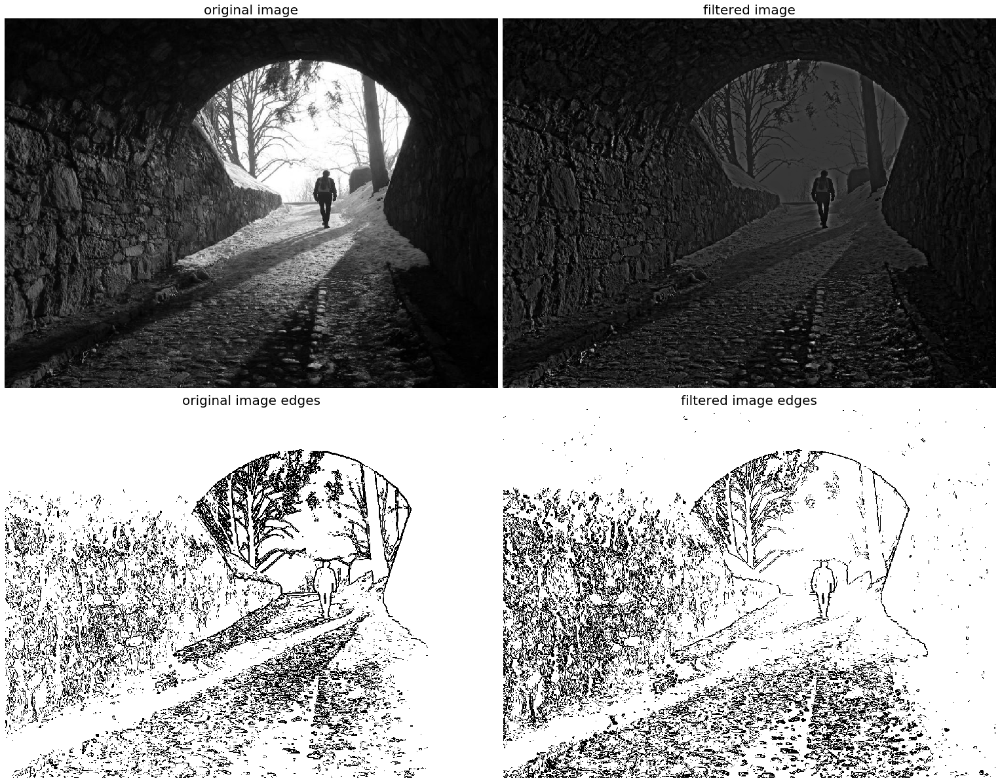

In [315]:
plt.figure(figsize=(21,17))
plt.gray()
plt.subplots_adjust(0,0,1,0.95,0.01,0.05)
plt.subplot(221), plt.imshow(image), plt.axis('off'), plt.title('original image', size=20)
plt.subplot(222), plt.imshow(image_filtered), plt.axis('off'), plt.title('filtered image', size=20)
plt.subplot(223), plt.imshow(image_edges), plt.axis('off'), plt.title('original image edges', size=20)
plt.subplot(224), plt.imshow(image_filtered_edges), plt.axis('off'), plt.title('filtered image edges', size=20)
plt.show()